# Задание 1

Сотрудник службы оценки качества продукции заметил, что число бракованных листов стали в партии для стали марки A больше, чем для стали марки B. Также он обратил внимание, что при средней скорости прокатки более 4 м/с число бракованных листов больше. В соответствии с этими наблюдениями, предлагается снизить скорость прокатки и ввести дополнительные меры контроля качества для стали марки A.  

Обоснуйте, что:

1)	Более 3 бракованных листов на партию выходит значимо чаще для стали марки А, чем для стали марки B.

2)	При скоростях прокатки более 4 м/с свыше 3 бракованных листов стали на партию выходит значимо чаще, чем при меньших скоростях прокатки.

Данные, необходимые для анализа, содержатся в файле «Статистика за 2018 год». Количество листов стали в каждой партии предполагается одинаковым. 


In [1]:
import pandas as pd
import numpy as np
from statsmodels.stats.weightstats import _tconfint_generic

D:\setup\Anaconda\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
# считываем данные
data = pd.read_csv('Статистика за 2018 год.csv',encoding='windows-1251')
data

,Число бракованных листов,Скорость прокатки,Марка стали
0,3,3.8,A
1,3,3.8,B
2,3,4.8,B
3,4,4.4,B
4,6,5.0,B
...,...,...,...
232,1,4.7,A
233,3,3.4,A
234,2,5.5,A
235,3,5.0,B


## Решение 

Для начала посмотрим на заполненность нашего датасета и распределение данных.

In [3]:
# количество пропусков в каждой категории 
data.isnull().sum()

Число бракованных листов    0
Скорость прокатки           0
Марка стали                 0
dtype: int64

In [4]:
# pip install plotly
import plotly
import plotly.express as px

# распределение Числа бракованных листов в зависимости от Скорости прокатки
fig1 = px.histogram(data, y="Число бракованных листов", x = "Скорость прокатки", title = 'Распределение числа бракованных листов в зависимости от скорости прокатки')
fig1.show()

fig2 = px.histogram(data, x="Число бракованных листов",color_discrete_sequence=['indianred'], title = 'Распределение частоты количества числа бракованных листов в партии')
fig2.show()

Воспользуемся Критерием Шапиро-Уилка для оценки нормальности распределения числа бракованных листов:

 $H_0\colon$ число бракованных листов распределено нормально
 
 $H_1\colon$ число бракованных листов распределено не нормально.

In [5]:
import scipy
from scipy import stats

print("Тест Шапиро-Уилка W-statistic: %f, p-value: %f" % stats.shapiro(data['Число бракованных листов']))

Тест Шапиро-Уилка W-statistic: 0.948817, p-value: 0.000000


Значение p-value < 0.05, следовательно, гипотеза H0 отвергается.

### Вывод:

- Датасет заполнен корректно. Пропусков в данных нет.
- Критерий Шапиро-Уилка показал, что данные по числу бракованных листов не распределены нормально.

Вернемся к гипотезам, которые предлагаются сотрудник службы оценки качества.

1. Более 3 бракованных листов на партию выходит значимо чаще для стали марки А, чем для стали марки B.

In [6]:
# определим для каждой марки стали датасет с числом бракованных листов более 3 на партию

# марка стали А
data_A = data[(data['Марка стали']=='A') & (data['Число бракованных листов']>3)]['Число бракованных листов']

# марка стали B
data_B = data[(data['Марка стали']=='B') & (data['Число бракованных листов']>3)]['Число бракованных листов']

Посмотрим на распределения по каждой марки стали.

In [7]:
import plotly.express as px


# распределение Числа бракованных листов в зависимости от Скорости прокатки
fig1 = px.histogram(data_A, title = 'Марка стали "А"')
fig1.show()

fig2 = px.histogram(data_B,color_discrete_sequence=['indianred'], title = 'Марка стали "В"')
fig2.show()

Рассчитаем доверительные интервалы для оценки среднего.
Поскольку у нас неизвестна дисперсия распределения, то используем выборочные дисперсии, и построим доверительные интервалы вида: $$\bar{X}_n \pm t_{1-\frac{\alpha}{2}} \frac{S}{\sqrt{n}}$$

In [8]:
# функция для расчета доверительных интервалов для оценки среднего
# _tconfint_generic подаются значения(выборочного среднего(Xn),выборочной дисперсии(S),параметр alpha,выбор альтернати)

def confidence_interval(df): 
    # 95% доверительный интервал
    interval = _tconfint_generic(df.mean(),
                                    df.std(ddof=1)/np.sqrt(df.shape[0]), 
                                    df.shape[0]-1, 0.05, 'two-sided') 
    
    return {'95% доверительный интервал': interval}

In [9]:
# значения для марки стали "А" и "B"
print('Значения для марки стали "А":', confidence_interval(data_A))
print('Значения для марки стали "В":', confidence_interval(data_B)) 

Значения для марки стали "А": {'95% доверительный интервал': (4.743957591263485, 5.482457503076138)}
Значения для марки стали "В": {'95% доверительный интервал': (4.550644180687348, 5.2220830920399255)}


Доверительные интервалы пересекаются сделать вывод о том, что гипотеза верна сложно.

#### Ранговый критерий Манна-Уитни

Воспользуемся ранговым критерием Манна-Уитни для оценки различий между двумя выборками.

H0: Вероятность того, что значение из первой выборки будет больше, чем значение из второй выборки равна вероятности того, что значение из второй выборки будет больше, чем значение из первой выборки.

H1: это не так

In [10]:
stats.mannwhitneyu(data_A, data_B)

MannwhitneyuResult(statistic=1078.5, pvalue=0.2490513227652355)

Поскольку значение p-value > 0.05 , то можно сделать вывод, что гипотеза H0 не отвергается.

### Вывод:

По доверительному интервалу можно заметить, что по марке стали "А" более 3 бракованных листов на партию встречается чаще, чем по марке стали "B".

Однако критерий Манна-Уитни показывает, что вероятность того, что значение из первой выборки будет больше, чем значение из второй выборки равна вероятности того, что значение из второй выборки будет больше, чем значение из первой выборки, то есть гипотезу о том, что "Более 3 бракованных листов на партию выходит значимо чаще для стали марки А, чем для стали марки B" нельзя считать правдивой.

2. При скоростях прокатки более 4 м/с свыше 3 бракованных листов стали на партию выходит значимо чаще, чем при меньших скоростях прокатки.

In [11]:
# определим датасеты в зависимости от Скорости прокатки и количества бракованных листов


# скорость прокатки более 4 м/с
speed_more = data[(data['Скорость прокатки']>4) & (data['Число бракованных листов']>3)]['Число бракованных листов']

# скорость прокатки менее 4 м/с
speed_less = data[(data['Скорость прокатки']<=4) & (data['Число бракованных листов']>3)]['Число бракованных листов']

In [12]:
import plotly.express as px


# распределение Числа бракованных листов в зависимости от Скорости прокатки
fig1 = px.histogram(speed_more, title = 'Значения для скорости прокатки более 4 м/с')
fig1.show()

fig2 = px.histogram(speed_less,color_discrete_sequence=['indianred'], title = 'Значения для скорости прокатки менее 4 м/с')
fig2.show()

In [13]:
# значения для марки стали "А" и "B"
print('Значения для скорости прокатки более 4 м/с:', confidence_interval(speed_more))
print('Значения для скорости прокатки менее 4 м/с:', confidence_interval(speed_less)) 

Значения для скорости прокатки более 4 м/с: {'95% доверительный интервал': (4.775160208256021, 5.332947899852088)}
Значения для скорости прокатки менее 4 м/с: {'95% доверительный интервал': (4.282053634235697, 5.457076800546912)}


#### Ранговый критерий Манна-Уитни

Воспользуемся ранговым критерием Манна-Уитни для оценки различий между двумя выборками.

H0: Вероятность того, что значение из первой выборки будет больше, чем значение из второй выборки равна вероятности того, что значение из второй выборки будет больше, чем значение из первой выборки.

H1: это не так

In [14]:
stats.mannwhitneyu(speed_more, speed_less)

MannwhitneyuResult(statistic=741.5, pvalue=0.1602225088663039)

Поскольку значение p-value > 0.05 , то можно сделать вывод, что гипотеза H0 не отвергается.

### Вывод:

Доверительный интервал для значений скорости прокатки более 4 м/с находится внутри доверительного интервала для значений скорости прокатки менее 4 м/с. 

Это означает, что для данного датасета при 95% довертительном интервале гипотеза о том, что "при скоростях прокатки более 4 м/с свыше 3 бракованных листов стали на партию выходит значимо чаще, чем при меньших скоростях прокатки", - не является верной.

Критерий Манна-Уитни для оценки различий между двумя выборками также подтверждает, что фактор скорости не влияет на увеличения количества бракованных листов свыше 3 на партию.

# Задание 2

Вам необходимо построить модель, которая на основании данных, поступающих каждую минуту, определяют качество продукции, производимое на обжиговой машине.

Обжиговая машина представляет собой агрегат, состоящий из 5 одинаковых по размеру камер, в каждой камере установлено по 3 датчика температур. Кроме этого, для данной задачи Вы собрали данные о высоте слоя сырья и его влажности. Высота слоя и влажность измеряются при входе сырья в машину. Сырье проходит через обжиговую машину за час.

Данные с показателями работы обжиговой машины содержатся в файле X_data.csv:


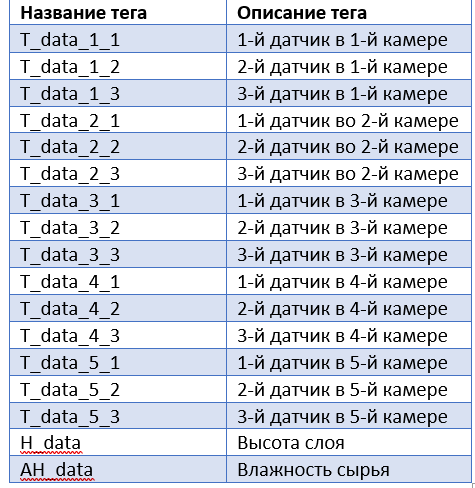

Качество продукции измеряется в лаборатории по пробам, которые забираются каждый час, данные по известным анализам содержатся в файле Y_train.csv. В файле указано время забора пробы, проба забирается на выходе из обжиговой машины.

Вы договорились с заказчиком, что оценкой модели будет являться показатель MAE, для оценки модели необходимо сгенерировать предсказания за период, указанный в файле Y_submit.csv (5808 предиктов).

Все необходимые данные лежат по ссылке: 
https://www.dropbox.com/s/lo2w549fv8lo3oc/Test2.7z


## Решение 

In [15]:
# считаем данные
X_data = pd.read_csv('X_data.csv', sep=';') # данные с показателями работы обжиговой машины
Y_train = pd.read_csv('Y_train.csv',sep=';', header=None)
Y_submit = pd.read_csv('Y_submit.csv',sep=';', header=None)

In [16]:
# данные с показателями работы обжиговой машины
X_data.head(5)

,Unnamed: 0,T_data_1_1,T_data_1_2,T_data_1_3,T_data_2_1,T_data_2_2,T_data_2_3,T_data_3_1,T_data_3_2,T_data_3_3,T_data_4_1,T_data_4_2,T_data_4_3,T_data_5_1,T_data_5_2,T_data_5_3,H_data,AH_data
0,2015-01-01 00:00:00,212,210,211,347,353,347,474,473,481,346,348,355,241,241,243,167.85,9.22
1,2015-01-01 00:01:00,212,211,211,346,352,346,475,473,481,349,348,355,241,241,243,162.51,9.22
2,2015-01-01 00:02:00,212,211,211,345,352,346,476,473,481,352,349,355,242,241,242,164.99,9.22
3,2015-01-01 00:03:00,213,211,211,344,351,346,477,473,481,355,349,355,242,241,242,167.34,9.22
4,2015-01-01 00:04:00,213,211,211,343,350,346,478,473,482,358,349,355,243,241,242,163.04,9.22


In [17]:
# данные по известным анализам
#В файле указано время забора пробы, проба забирается на выходе из обжиговой машины.

Y_train.head(5)

,0,1
0,2015-01-04 00:05:00,392
1,2015-01-04 01:05:00,384
2,2015-01-04 02:05:00,393
3,2015-01-04 03:05:00,399
4,2015-01-04 04:05:00,400


In [18]:
# данные по которым необходимо сгенерировать предсказания за период
Y_submit.head(5)

,0,1
0,2018-05-04 00:05:00,420
1,2018-05-04 01:05:00,420
2,2018-05-04 02:05:00,420
3,2018-05-04 03:05:00,420
4,2018-05-04 04:05:00,420


### 1. Краткий анализ X_data.

In [19]:
# размер датасета
X_data.shape

(2103841, 18)

In [20]:
X_data.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2103841 entries, 0 to 2103840
Data columns (total 18 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   Unnamed: 0  2103841 non-null  object 
 1   T_data_1_1  2103841 non-null  int64  
 2   T_data_1_2  2103841 non-null  int64  
 3   T_data_1_3  2103841 non-null  int64  
 4   T_data_2_1  2103841 non-null  int64  
 5   T_data_2_2  2103841 non-null  int64  
 6   T_data_2_3  2103841 non-null  int64  
 7   T_data_3_1  2103841 non-null  int64  
 8   T_data_3_2  2103841 non-null  int64  
 9   T_data_3_3  2103841 non-null  int64  
 10  T_data_4_1  2103841 non-null  int64  
 11  T_data_4_2  2103841 non-null  int64  
 12  T_data_4_3  2103841 non-null  int64  
 13  T_data_5_1  2103841 non-null  int64  
 14  T_data_5_2  2103841 non-null  int64  
 15  T_data_5_3  2103841 non-null  int64  
 16  H_data      2103841 non-null  float64
 17  AH_data     2103841 non-null  float64
dtypes: float64(2), int64(1

D:\setup\Anaconda\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



### Вывод:

В датасете нет пропущеных значений.

### 2. Анализ поставленной задачи.

Из условия задачи известно, что "Высота слоя (H_data) и влажность (AH_data) измеряются при входе сырья в машину. Сырье проходит через обжиговую машину за час".

Следовательно, можно сделать следующий вывод:

Сырье поступает в обжиговую машину во время, которое указано в первом столбце ('Unnamed: 0') X_data.
Чтобы получить информацию по качеству продукции, необходимо к  X_data['Unnamed: 0'] добавить 1 час и сопоставить эти данные с Y_train.

In [21]:
from datetime import datetime, timedelta

# добавим к времени входа + 1 час
X_data['Unnamed: 0'] = pd.to_datetime(X_data['Unnamed: 0']) + timedelta(hours=1)

In [22]:
X_data[['Unnamed: 0']]

,Unnamed: 0
0,2015-01-01 01:00:00
1,2015-01-01 01:01:00
2,2015-01-01 01:02:00
3,2015-01-01 01:03:00
4,2015-01-01 01:04:00
...,...
2103836,2019-01-01 00:56:00
2103837,2019-01-01 00:57:00
2103838,2019-01-01 00:58:00
2103839,2019-01-01 00:59:00


In [23]:
# сопоставим значения из Y_train с X_data
data_for_modeling = X_data.loc[X_data['Unnamed: 0'].isin(Y_train[0])]

print('Размерность получившегося датасета: ', data_for_modeling.shape)
print('Размерность Y_train: ', Y_train.shape)     

Размерность получившегося датасета:  (29184, 18)
Размерность Y_train:  (29184, 2)


In [24]:
data_for_modeling

,Unnamed: 0,T_data_1_1,T_data_1_2,T_data_1_3,T_data_2_1,T_data_2_2,T_data_2_3,T_data_3_1,T_data_3_2,T_data_3_3,T_data_4_1,T_data_4_2,T_data_4_3,T_data_5_1,T_data_5_2,T_data_5_3,H_data,AH_data
4265,2015-01-04 00:05:00,266,339,263,335,326,341,495,497,535,316,346,336,234,238,239,154.87,4.73
4325,2015-01-04 01:05:00,277,326,273,322,335,352,505,501,670,326,379,337,231,236,242,153.77,7.90
4385,2015-01-04 02:05:00,277,253,272,320,333,355,500,501,687,337,396,335,234,242,230,158.27,6.96
4445,2015-01-04 03:05:00,262,218,260,326,336,330,505,499,443,347,399,332,243,251,240,153.36,7.29
4505,2015-01-04 04:05:00,243,238,252,327,329,308,520,498,540,342,387,334,257,258,246,153.21,7.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1755005,2018-05-03 19:05:00,256,249,261,381,388,367,456,327,465,357,356,350,242,258,261,156.23,7.79
1755065,2018-05-03 20:05:00,257,258,266,379,381,358,449,386,461,354,350,349,234,254,252,157.47,7.33
1755125,2018-05-03 21:05:00,259,255,260,372,367,362,431,461,453,360,344,348,235,253,247,157.17,7.87
1755185,2018-05-03 22:05:00,260,254,263,364,349,352,429,425,446,348,360,345,256,257,247,155.00,7.65


Посмотрим на распределение признаков в data_for_modeling

In [25]:
for i in list(data_for_modeling.loc[:, data_for_modeling.columns != 'Unnamed: 0'].columns):
    fig1 = px.histogram(data_for_modeling[i], title = i)
    fig1.show()

### Вывод:

Сформировали датасет, который будет использоваться для моделирования, путем добавления времени обжига (1 час) ко времени входа сырья в машина и сопоставлением этого датафрейма с Y_train.

Получился датасет размером (29184, 18). В целом, признаки в датасете не имеют каких-то аномалий и значительных выбросов.
Можно приступать к моделированию.

### 3. Разделение данных на train и test.

In [26]:
from sklearn.model_selection import cross_val_score, train_test_split

# убереме из датасет столбец с информцией о времени 
X_train, X_test, y_train, y_test = train_test_split(data_for_modeling.loc[:, data_for_modeling.columns != 'Unnamed: 0'],
                                                    Y_train[1], shuffle=True,
                                                    test_size=0.2, random_state=3)

In [27]:
# размерность данных для обучения и тестирования
print('Данные для обучения: ', X_train.shape,y_train.shape)
print('Данные для теста: ',X_test.shape, y_test.shape)

Данные для обучения:  (23347, 17) (23347,)
Данные для теста:  (5837, 17) (5837,)


### Вывод:

Сформировали датасеты для обучения и теста в соотношении 80/20.

### 4. Построение модели.

Построим несколько моделей, чтобы сравнить какой алгоритм покажет себя лучше.
Остановимся на моделях:
- Градиентоный бустинг с подбором параметров.
- Случайный лес с подборо параметров.
- Xgboost из коробки.

Подберем параметры, обучим алгоритм и оценим метрику MAE для каждого алгоритма.

### 4.1. Градиентный бустинг.

In [28]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

import warnings
warnings.filterwarnings('ignore')

Сделаем небольшой подбор гиперпараметров при помощи GridSearch

In [32]:
# список параметров для бустинга
boosting_params = {
    'n_estimators': list(range(100,500,100)),
    'min_samples_leaf': list(range(2,6,2)),
    'max_depth': list(range(5,10,2)), 
    'max_features': list(range(5,10,2)),
    }

boosting_gs = GridSearchCV(GradientBoostingRegressor(random_state=3),
                                   boosting_params, 
                                   scoring='neg_mean_absolute_error',  
                                   n_jobs=-1, 
                                   verbose=True)


# обучаем GridSearchCV
boosting_gs.fit(X_train, y_train)

Fitting 5 folds for each of 72 candidates, totalling 360 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 360 out of 360 | elapsed: 17.3min finished


GridSearchCV(estimator=GradientBoostingRegressor(random_state=3), n_jobs=-1,
             param_grid={'max_depth': [5, 7, 9], 'max_features': [5, 7, 9],
                         'min_samples_leaf': [2, 4],
                         'n_estimators': [100, 200, 300, 400]},
             scoring='neg_mean_absolute_error', verbose=True)

In [33]:
boosting_gs.best_params_

{'max_depth': 9, 'max_features': 9, 'min_samples_leaf': 4, 'n_estimators': 200}

In [29]:
print('Параметры для алгоритма:')
print('max_depth: 9, max_features: 9, min_samples_leaf: 4, n_estimators: 200')

Параметры для алгоритма:
max_depth: 9, max_features: 9, min_samples_leaf: 4, n_estimators: 200


In [30]:
#укажем параметры в алгоритме
model_gb = GradientBoostingRegressor(max_depth=9, max_features= 9, 
                                 min_samples_leaf=4, n_estimators=200, 
                                 random_state=3)
# обучаем модель
model_gb.fit(X_train, y_train)

# делаем предсказания 
predictions_model_gb = model_gb.predict(X_test)

In [31]:
from sklearn.metrics import mean_absolute_error

print('Значение метрики МАE на отложенной выборке для алгоритма градиетного бустинга:', mean_absolute_error(y_test, predictions_model_gb))

Значение метрики МАE на отложенной выборке для алгоритма градиетного бустинга: 8.795569843286088


### 4.2. Случайные лес

In [32]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

import warnings
warnings.filterwarnings('ignore')

In [38]:
# список параметров для случайного леса
forest_params = {
    'n_estimators': list(range(1500,2000, 100)),
    'max_depth': list(range(22, 28, 2)), 
    'max_features': list(range(8,16,2)),
    }

forest_gs = GridSearchCV(RandomForestRegressor(n_jobs=-1, random_state=3),
                                   forest_params, 
                                   scoring='neg_mean_absolute_error',  
                                   n_jobs=-1, 
                                   verbose=True)


forest_gs.fit(X_train, y_train)

Fitting 5 folds for each of 60 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 26.8min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 142.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 227.2min finished


GridSearchCV(estimator=RandomForestRegressor(n_jobs=-1, random_state=2),
             n_jobs=-1,
             param_grid={'max_depth': [22, 24, 26],
                         'max_features': [8, 10, 12, 14],
                         'n_estimators': [1500, 1600, 1700, 1800, 1900]},
             scoring='neg_mean_absolute_error', verbose=True)

In [39]:
forest_gs.best_params_

{'max_depth': 26, 'max_features': 12, 'n_estimators': 1900}

In [33]:
print('Параметры для алгоритма:')
print('max_depth: 26, max_features: 12, n_estimators: 1900')

Параметры для алгоритма:
max_depth: 26, max_features: 12, n_estimators: 1900


In [34]:
model_rf = RandomForestRegressor(max_depth=26, max_features=12, n_estimators=1900, 
                                 random_state=3)
# обучаем модель
model_rf.fit(X_train, y_train)

# делаем предсказания 
predictions_model_rf = model_rf.predict(X_test)

In [35]:
from sklearn.metrics import mean_absolute_error

print('Значение метрики МАE на отложенной выборке для алгоритма случайный лес:', mean_absolute_error(y_test, predictions_model_rf))

Значение метрики МАE на отложенной выборке для алгоритма случайный лес: 9.006971723199252


### 4.3. Xgboost

In [36]:
import xgboost as xgb

model_xgb = xgb.XGBRegressor(random_state=3) 

# обучаем модель
model_xgb.fit(X_train, y_train)

# делаем предсказания 
predictions_model_xgb = model_xgb.predict(X_test)

In [37]:
from sklearn.metrics import mean_absolute_error

print('Значение метрики МАE на отложенной выборке для алгоритма xgboost:', mean_absolute_error(y_test, predictions_model_xgb))

Значение метрики МАE на отложенной выборке для алгоритма xgboost: 9.518434295471307


### Вывод:

Модель градиентного бустинга с подбором параметров показала себя лучше, поэтому остановимся на ней.

### 5. Вычисление качества продукции для Y_submit.

In [43]:
Y_submit.head(5)

,0,1
0,2018-05-04 00:05:00,420
1,2018-05-04 01:05:00,420
2,2018-05-04 02:05:00,420
3,2018-05-04 03:05:00,420
4,2018-05-04 04:05:00,420


In [44]:
# предсказания за период, указанный в файле Y_submit
X_submit = X_data.loc[X_data['Unnamed: 0'].isin(Y_submit[0])]
X_submit.shape, Y_submit.shape

((5808, 18), (5808, 2))

In [45]:
X_submit

,Unnamed: 0,T_data_1_1,T_data_1_2,T_data_1_3,T_data_2_1,T_data_2_2,T_data_2_3,T_data_3_1,T_data_3_2,T_data_3_3,T_data_4_1,T_data_4_2,T_data_4_3,T_data_5_1,T_data_5_2,T_data_5_3,H_data,AH_data
1755305,2018-05-04 00:05:00,254,257,256,349,350,355,451,454,439,347,342,331,255,266,245,157.46,6.39
1755365,2018-05-04 01:05:00,258,261,256,347,337,352,474,434,443,336,321,516,248,247,236,154.93,6.81
1755425,2018-05-04 02:05:00,255,263,258,351,-162,359,460,441,454,320,319,341,238,255,236,156.52,7.89
1755485,2018-05-04 03:05:00,259,261,288,363,104,374,482,474,483,343,325,307,226,249,255,153.37,6.16
1755545,2018-05-04 04:05:00,272,266,279,373,338,386,495,510,503,330,307,323,213,245,250,161.45,7.53
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2103485,2018-12-31 19:05:00,266,265,262,356,355,202,452,472,444,348,358,360,281,272,281,181.59,6.95
2103545,2018-12-31 20:05:00,265,270,263,365,365,334,362,449,416,340,347,338,277,281,272,184.92,11.00
2103605,2018-12-31 21:05:00,263,260,257,378,364,380,458,449,451,333,325,332,277,282,274,188.16,6.38
2103665,2018-12-31 22:05:00,268,276,255,370,367,362,481,449,486,327,322,324,277,280,278,184.10,8.37


In [46]:
# генерируем предсказания в Y_pred
Y_pred = pd.DataFrame(model_gb.predict(X_submit.loc[:, X_submit.columns != 'Unnamed: 0']))

In [47]:
Y_pred

,0
0,452.838393
1,436.822594
2,448.112021
3,423.052233
4,407.168866
...,...
5803,463.456033
5804,474.503109
5805,467.853103
5806,446.773501


In [48]:
# выгрузка в csv
Y_pred.to_csv('Y_pred.csv')

### Вывод:

Можно также постараться улучшить модель путем подбора более сложных алгоритмов (CatBoost, LightGBM, Нейронные сети) и генерацией новых фичей на основе исходных признаков (квадраты признаков, квадратные корни из признаков, логарфимы и т.д.)